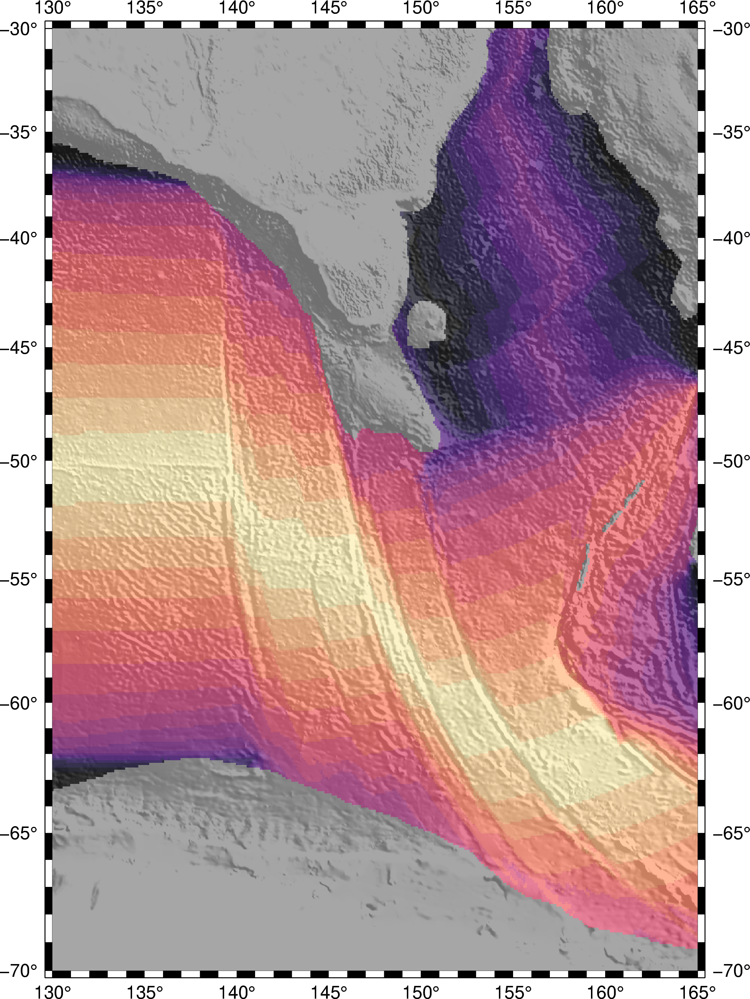

In [1]:
import pygmt
import numpy as np
import xarray as xr

topofile = '/Users/simon/Data/GMTdata/hawaii2017/earth_relief_02m.grd'
agefile = './Data/EarthByte_AREPS_Muller_etal_2016_AgeGrid.nc'

fig = pygmt.Figure()
fig.basemap(frame='afg',
            region='130/165/-70/-30',
            projection='Cyl_stere/150/-20/15c',)
pygmt.makecpt(cmap='magma', series='0/80/5', reverse=True)
fig.grdimage(
    grid=agefile)
pygmt.makecpt(cmap='gray', series='-8000/0')
fig.grdimage(
    grid=topofile,
    shading='+a45+nt2+m0.1',
    t=70)
fig.show()

In [2]:
age_dataarray = xr.open_dataarray(agefile)

# Compute Stein & Stein [1992] depth-age curve
# depth(t) =  365 * sqrt(t) + 2600,  t < 20 Myr
#	   = 5651 - 2473 * exp (-0.0278*t), t > 20 Myr
    
expected_depth = 365. * np.sqrt(age_dataarray.data) + 2600.
expected_depth[age_dataarray.data>20] = 5651 - 2473 * np.exp(-0.0278*age_dataarray.data[age_dataarray.data>20])

expected_depth_dataarray = age_dataarray.copy()
expected_depth_dataarray.data = expected_depth


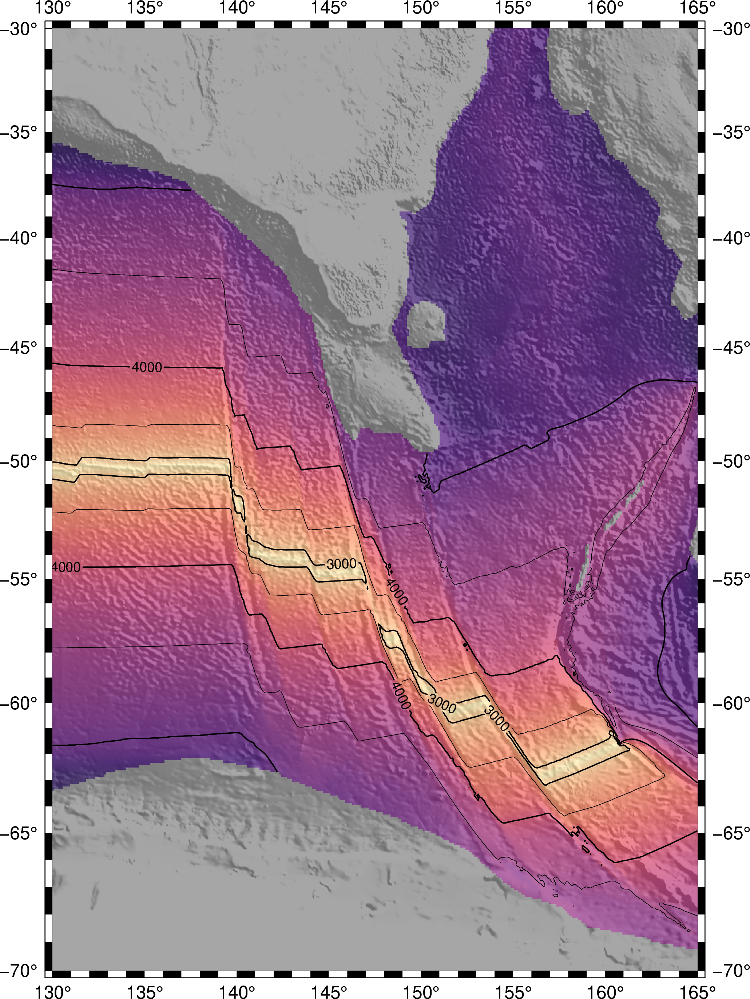

In [3]:
fig = pygmt.Figure()
fig.basemap(frame='afg',
            region='130/165/-70/-30',
            projection='Cyl_stere/150/-20/15c',)
pygmt.makecpt(cmap='magma', series='2600/6000', reverse=True)
fig.grdimage(
    grid=expected_depth_dataarray)
pygmt.makecpt(cmap='gray', series='-8000/0')
fig.grdimage(
    grid=topofile,
    shading='+a45+nt2+m0.1',
    t=70)
fig.grdcontour(
    annotation=1000,
    interval=500,
    grid=expected_depth_dataarray,
)
fig.show()

In [4]:
topo_dataarray = xr.open_dataarray(topofile)
topo_dataarray = topo_dataarray * -1.
residual_depth = topo_dataarray - expected_depth_dataarray

fig = pygmt.Figure()
fig.basemap(frame='afg',
            region='130/165/-70/-30',
            projection='Cyl_stere/150/-20/15c',)
pygmt.makecpt(cmap='polar', series='-2000/2000', reverse=True)
fig.grdimage(
    grid=residual_depth)
pygmt.makecpt(cmap='gray', series='-8000/0')
fig.grdimage(
    grid=topofile,
    shading='+a45+nt2+m0.1',
    t=70)
fig.grdcontour(
    annotation=1000,
    interval=500,
    grid=residual_depth,
)
fig.show()

GMTInvalidInput: Grid appears to have irregular spacing in the 'lon' dimension.

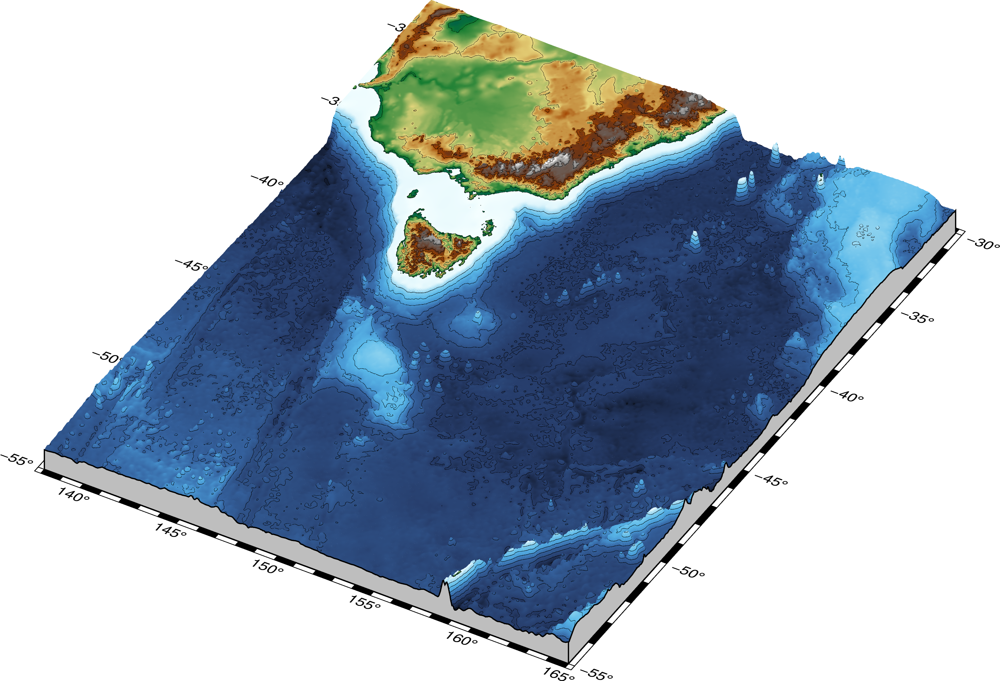

In [5]:
topo_clip = pygmt.grdcut(grid=topofile, region='138/165/-55/-30')

fig = pygmt.Figure()

fig.grdview(
    grid=topo_clip,
    # Set the azimuth to -130 (230) degrees and the elevation to 30 degrees
    perspective=[150, 40],
    frame=["xaf", "yaf", "WSnE"],
    projection="M15c",
    zsize="1.5c",
    surftype="s",
    cmap="geo",
    plane="-8000+ggrey",
    # Set the contour pen thickness to "0.1p"
    contourpen="0.1p",
)

fig.show(width=1200)

In [ ]:
topo_clip = pygmt.grdcut(grid=topofile, region='138/165/-55/-30')
age_clip = pygmt.grdcut(grid=agefile, region='138/165/-55/-30')

fig = pygmt.Figure()

#pygmt.makecpt(cmap='magma', series='0/80/5', reverse=True)

fig.grdview(
    grid=topo_clip,
    drapegrid=age_clip,
    # Set the azimuth to -130 (230) degrees and the elevation to 30 degrees
    perspective=[150, 40],
    frame=["xaf", "yaf", "WSnE"],
    projection="M15c",
    #zsize="1.5c",
    surftype="s",
    cmap='hot',
    plane="-8000+ggrey",
    # Set the contour pen thickness to "0.1p"
    #contourpen="0.1p",
)

fig.show(width=1200)

In [7]:
topo_clip = pygmt.grdcut(grid='./Data/Bathymetry_nc4.nc', region='155/157/-38.1/-36.3')

fig = pygmt.Figure()

#pygmt.makecpt(cmap='magma', series='0/80/5', reverse=True)

fig.grdview(
    grid=topo_clip,
    # Set the azimuth to -130 (230) degrees and the elevation to 30 degrees
    perspective=[150, 40],
    frame=["xaf", "yaf", "WSnE"],
    projection="M15c",
    #zsize="1.5c",
    surftype="s",
    cmap='hot',
    plane="-8000+ggrey",
    # Set the contour pen thickness to "0.1p"
    #contourpen="0.1p",
)

fig.show(width=1200)


grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 155 to 154.999689
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 157 to 157.000689
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -38.1 to -38.100442
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -36.3 to -36.299442
psconvert [ERROR]: System call [gs -q -dNOPAUSE -dBATCH -dNOSAFER -dSCANCONVERTERTYPE=2 -dMaxBitmap=2147483647 -dUseFastColor=true -dGraphicsAlphaBits=2 -dTextAlphaBits=2 -sDEVICE=pngalpha  -g2741x1763 -r300 -sOutputFile='/var/folders/k2/jz_0twls1q13vbr87bqwdtr40000gn/T/4a9d4573b2574e1ca71a8a3620cf7c9a-preview-gvrdnp91/4a9d4573b2574e1ca71a8a3620cf7c9a.png' '/Users/simon/.gm

GMTCLibError: Module 'psconvert' failed with status code 78:
psconvert [ERROR]: System call [gs -q -dNOPAUSE -dBATCH -dNOSAFER -dSCANCONVERTERTYPE=2 -dMaxBitmap=2147483647 -dUseFastColor=true -dGraphicsAlphaBits=2 -dTextAlphaBits=2 -sDEVICE=pngalpha  -g2741x1763 -r300 -sOutputFile='/var/folders/k2/jz_0twls1q13vbr87bqwdtr40000gn/T/4a9d4573b2574e1ca71a8a3620cf7c9a-preview-gvrdnp91/4a9d4573b2574e1ca71a8a3620cf7c9a.png' '/Users/simon/.gmt/sessions/gmt_session.50868/psconvert_50868d.eps'] returned error 2.

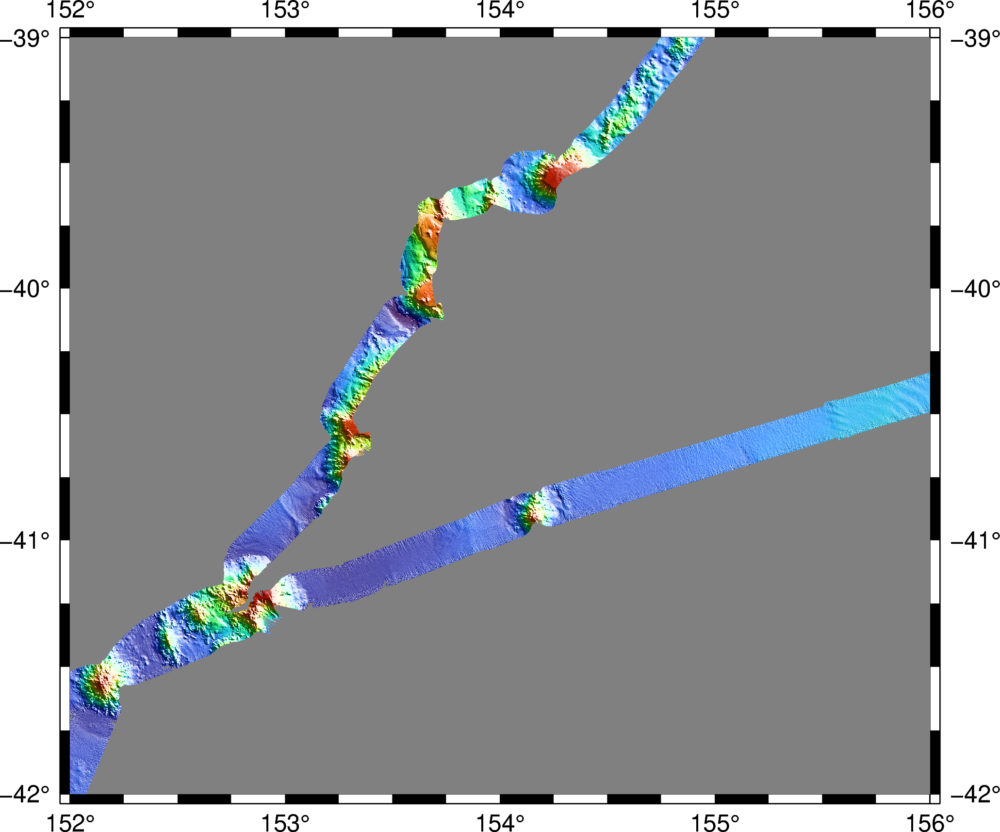

In [33]:
fig = pygmt.Figure()
fig.basemap(frame='afg',
            region='152/156/-42/-39',
            projection='Cyl_stere/150/-20/15c',)
fig.grdimage(
    grid='./Data/Bathymetry_nc4.nc',
    shading='+a45+nt2+m0.1',)
fig.show(width=800)


In [41]:
def plot_seamount(region):
    topo_clip = pygmt.grdcut(grid=topofile, region=region)
    dtopo_clip = pygmt.grdcut(grid='./Data/Bathymetry_nc4.nc', region=region)

    fig = pygmt.Figure()

    pygmt.makecpt(cmap='geo', series='-6000/-2000/200')

    fig.grdview(
        grid=topo_clip,
        shading='+a45+nt0.5+m0.1',
        # Set the azimuth to -130 (230) degrees and the elevation to 30 degrees
        perspective=[-150, 40],
        frame=["xaf", "yaf", "WSnE"],
        projection="M15c",
        zsize="1.5c",
        surftype="s",
        cmap=True,
        plane="-8000+ggrey",
        # Set the contour pen thickness to "0.1p"
        #contourpen="0.1p",
    )

    fig.grdview(
        grid=dtopo_clip,
        shading='+a45+nt0.5+m0.1',
        # Set the azimuth to -130 (230) degrees and the elevation to 30 degrees
        perspective=[-150, 40],
        #frame=["xaf", "yaf", "WSnE"],
        projection="M15c",
        zsize="1.5c",
        surftype="s",
        cmap=True,
        #plane="-8000+ggrey",
        # Set the contour pen thickness to "0.1p"
        #contourpen="0.1p",
    )
    
    return fig


grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 153.9 to 153.899689
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 154.4 to 154.400689
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -41 to -41.000442
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -40.7 to -40.699442


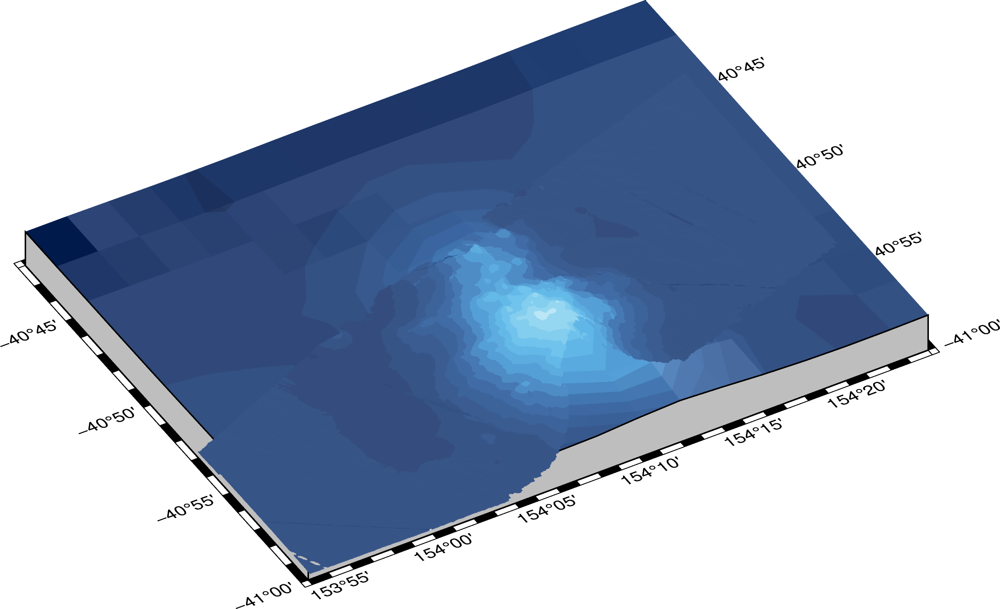

In [42]:
fig = plot_seamount('153.9/154.4/-41/-40.7')
fig.show(width=1200)


grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -39.75 to -39.7666666667
grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 154 to 153.999689
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 154.6 to 154.600689
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -39.75 to -39.750442
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -39.4 to -39.399442


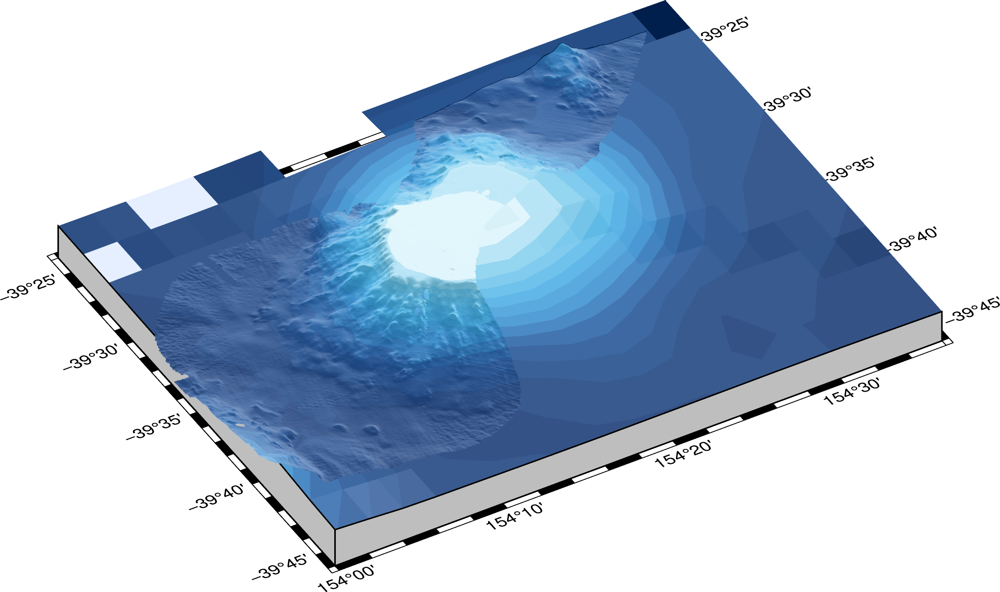

In [43]:
fig = plot_seamount('154/154.6/-39.75/-39.4')
fig.show(width=1200)
